In [1]:
import numpy as np

# importing data
import pandas as pd

# visualization
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px


# warnings
import warnings 
warnings.filterwarnings("ignore")

# scaling
from sklearn.preprocessing import StandardScaler

# metrics
from sklearn import metrics
from sklearn.metrics import silhouette_score
from sklearn.metrics import calinski_harabasz_score

# KMeans cluster
from sklearn.cluster import KMeans
from kneed import KneeLocator

# MiniBatchKMeans
from sklearn.cluster import MiniBatchKMeans

In [2]:
# !pip install pandas_profiling
!pip install kneed

In [3]:
data1 = pd.read_csv ("E:/ML course/4- ML/Data/37- clustering P/Customer_Data.csv")      ### Calling Data
data1

,CUST_ID,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,C10001,40.900749,0.818182,95.40,0.00,95.40,0.000000,0.166667,0.000000,0.083333,0.000000,0,2,1000.0,201.802084,139.509787,0.000000,12
1,C10002,3202.467416,0.909091,0.00,0.00,0.00,6442.945483,0.000000,0.000000,0.000000,0.250000,4,0,7000.0,4103.032597,1072.340217,0.222222,12
2,C10003,2495.148862,1.000000,773.17,773.17,0.00,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,7500.0,622.066742,627.284787,0.000000,12
3,C10004,1666.670542,0.636364,1499.00,1499.00,0.00,205.788017,0.083333,0.083333,0.000000,0.083333,1,1,7500.0,0.000000,NaN,0.000000,12
4,C10005,817.714335,1.000000,16.00,16.00,0.00,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,1200.0,678.334763,244.791237,0.000000,12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8945,C19186,28.493517,1.000000,291.12,0.00,291.12,0.000000,1.000000,0.000000,0.833333,0.000000,0,6,1000.0,325.594462,48.886365,0.500000,6
8946,C19187,19.183215,1.000000,300.00,0.00,300.00,0.000000,1.000000,0.000000,0.833333,0.000000,0,6,1000.0,275.861322,NaN,0.000000,6
8947,C19188,23.398673,0.833333,144.40,0.00,144.40,0.000000,0.833333,0.000000,0.666667,0.000000,0,5,1000.0,81.270775,82.418369,0.250000,6
8948,C19189,13.457564,0.833333,0.00,0.00,0.00,36.558778,0.000000,0.000000,0.000000,0.166667,2,0,500.0,52.549959,55.755628,0.250000,6


In [4]:
df = pd.DataFrame(data1)                    ### making Dataframe
df

,CUST_ID,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,C10001,40.900749,0.818182,95.40,0.00,95.40,0.000000,0.166667,0.000000,0.083333,0.000000,0,2,1000.0,201.802084,139.509787,0.000000,12
1,C10002,3202.467416,0.909091,0.00,0.00,0.00,6442.945483,0.000000,0.000000,0.000000,0.250000,4,0,7000.0,4103.032597,1072.340217,0.222222,12
2,C10003,2495.148862,1.000000,773.17,773.17,0.00,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,7500.0,622.066742,627.284787,0.000000,12
3,C10004,1666.670542,0.636364,1499.00,1499.00,0.00,205.788017,0.083333,0.083333,0.000000,0.083333,1,1,7500.0,0.000000,NaN,0.000000,12
4,C10005,817.714335,1.000000,16.00,16.00,0.00,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,1200.0,678.334763,244.791237,0.000000,12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8945,C19186,28.493517,1.000000,291.12,0.00,291.12,0.000000,1.000000,0.000000,0.833333,0.000000,0,6,1000.0,325.594462,48.886365,0.500000,6
8946,C19187,19.183215,1.000000,300.00,0.00,300.00,0.000000,1.000000,0.000000,0.833333,0.000000,0,6,1000.0,275.861322,NaN,0.000000,6
8947,C19188,23.398673,0.833333,144.40,0.00,144.40,0.000000,0.833333,0.000000,0.666667,0.000000,0,5,1000.0,81.270775,82.418369,0.250000,6
8948,C19189,13.457564,0.833333,0.00,0.00,0.00,36.558778,0.000000,0.000000,0.000000,0.166667,2,0,500.0,52.549959,55.755628,0.250000,6


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8950 entries, 0 to 8949
Data columns (total 18 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   CUST_ID                           8950 non-null   object 
 1   BALANCE                           8950 non-null   float64
 2   BALANCE_FREQUENCY                 8950 non-null   float64
 3   PURCHASES                         8950 non-null   float64
 4   ONEOFF_PURCHASES                  8950 non-null   float64
 5   INSTALLMENTS_PURCHASES            8950 non-null   float64
 6   CASH_ADVANCE                      8950 non-null   float64
 7   PURCHASES_FREQUENCY               8950 non-null   float64
 8   ONEOFF_PURCHASES_FREQUENCY        8950 non-null   float64
 9   PURCHASES_INSTALLMENTS_FREQUENCY  8950 non-null   float64
 10  CASH_ADVANCE_FREQUENCY            8950 non-null   float64
 11  CASH_ADVANCE_TRX                  8950 non-null   int64  
 12  PURCHA

In [6]:
df.describe(include='all')

,CUST_ID,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
count,8950,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8949.000000,8950.000000,8637.000000,8950.000000,8950.000000
unique,8950,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,C10001,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,NaN,1564.474828,0.877271,1003.204834,592.437371,411.067645,978.871112,0.490351,0.202458,0.364437,0.135144,3.248827,14.709832,4494.449450,1733.143852,864.206542,0.153715,11.517318
std,NaN,2081.531879,0.236904,2136.634782,1659.887917,904.338115,2097.163877,0.401371,0.298336,0.397448,0.200121,6.824647,24.857649,3638.815725,2895.063757,2372.446607,0.292499,1.338331
min,NaN,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,50.000000,0.000000,0.019163,0.000000,6.000000
25%,NaN,128.281915,0.888889,39.635000,0.000000,0.000000,0.000000,0.083333,0.000000,0.000000,0.000000,0.000000,1.000000,1600.000000,383.276166,169.123707,0.000000,12.000000
50%,NaN,873.385231,1.000000,361.280000,38.000000,89.000000,0.000000,0.500000,0.083333,0.166667,0.000000,0.000000,7.000000,3000.000000,856.901546,312.343947,0.000000,12.000000
75%,NaN,2054.140036,1.000000,1110.130000,577.405000,468.637500,1113.821139,0.916667,0.300000,0.750000,0.222222,4.000000,17.000000,6500.000000,1901.134317,825.485459,0.142857,12.000000


In [7]:
df.isnull().sum()          # we have missing value in 2 featuers

CUST_ID                               0
BALANCE                               0
BALANCE_FREQUENCY                     0
PURCHASES                             0
ONEOFF_PURCHASES                      0
INSTALLMENTS_PURCHASES                0
CASH_ADVANCE                          0
PURCHASES_FREQUENCY                   0
ONEOFF_PURCHASES_FREQUENCY            0
PURCHASES_INSTALLMENTS_FREQUENCY      0
CASH_ADVANCE_FREQUENCY                0
CASH_ADVANCE_TRX                      0
PURCHASES_TRX                         0
CREDIT_LIMIT                          1
PAYMENTS                              0
MINIMUM_PAYMENTS                    313
PRC_FULL_PAYMENT                      0
TENURE                                0
dtype: int64

In [8]:
df.nunique()

CUST_ID                             8950
BALANCE                             8871
BALANCE_FREQUENCY                     43
PURCHASES                           6203
ONEOFF_PURCHASES                    4014
INSTALLMENTS_PURCHASES              4452
CASH_ADVANCE                        4323
PURCHASES_FREQUENCY                   47
ONEOFF_PURCHASES_FREQUENCY            47
PURCHASES_INSTALLMENTS_FREQUENCY      47
CASH_ADVANCE_FREQUENCY                54
CASH_ADVANCE_TRX                      65
PURCHASES_TRX                        173
CREDIT_LIMIT                         205
PAYMENTS                            8711
MINIMUM_PAYMENTS                    8636
PRC_FULL_PAYMENT                      47
TENURE                                 7
dtype: int64

In [9]:
df1 = df.dropna()       #  in comparision with all data (8950), we can delet missing value and ignor them at first
df1

,CUST_ID,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,C10001,40.900749,0.818182,95.40,0.00,95.40,0.000000,0.166667,0.000000,0.083333,0.000000,0,2,1000.0,201.802084,139.509787,0.000000,12
1,C10002,3202.467416,0.909091,0.00,0.00,0.00,6442.945483,0.000000,0.000000,0.000000,0.250000,4,0,7000.0,4103.032597,1072.340217,0.222222,12
2,C10003,2495.148862,1.000000,773.17,773.17,0.00,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,7500.0,622.066742,627.284787,0.000000,12
4,C10005,817.714335,1.000000,16.00,16.00,0.00,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,1200.0,678.334763,244.791237,0.000000,12
5,C10006,1809.828751,1.000000,1333.28,0.00,1333.28,0.000000,0.666667,0.000000,0.583333,0.000000,0,8,1800.0,1400.057770,2407.246035,0.000000,12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8943,C19184,5.871712,0.500000,20.90,20.90,0.00,0.000000,0.166667,0.166667,0.000000,0.000000,0,1,500.0,58.644883,43.473717,0.000000,6
8945,C19186,28.493517,1.000000,291.12,0.00,291.12,0.000000,1.000000,0.000000,0.833333,0.000000,0,6,1000.0,325.594462,48.886365,0.500000,6
8947,C19188,23.398673,0.833333,144.40,0.00,144.40,0.000000,0.833333,0.000000,0.666667,0.000000,0,5,1000.0,81.270775,82.418369,0.250000,6
8948,C19189,13.457564,0.833333,0.00,0.00,0.00,36.558778,0.000000,0.000000,0.000000,0.166667,2,0,500.0,52.549959,55.755628,0.250000,6


In [10]:
df2 = df1.drop(["CUST_ID"], axis=1)       # we dont need 'CUST_ID'
df2

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,40.900749,0.818182,95.40,0.00,95.40,0.000000,0.166667,0.000000,0.083333,0.000000,0,2,1000.0,201.802084,139.509787,0.000000,12
1,3202.467416,0.909091,0.00,0.00,0.00,6442.945483,0.000000,0.000000,0.000000,0.250000,4,0,7000.0,4103.032597,1072.340217,0.222222,12
2,2495.148862,1.000000,773.17,773.17,0.00,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,7500.0,622.066742,627.284787,0.000000,12
4,817.714335,1.000000,16.00,16.00,0.00,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,1200.0,678.334763,244.791237,0.000000,12
5,1809.828751,1.000000,1333.28,0.00,1333.28,0.000000,0.666667,0.000000,0.583333,0.000000,0,8,1800.0,1400.057770,2407.246035,0.000000,12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8943,5.871712,0.500000,20.90,20.90,0.00,0.000000,0.166667,0.166667,0.000000,0.000000,0,1,500.0,58.644883,43.473717,0.000000,6
8945,28.493517,1.000000,291.12,0.00,291.12,0.000000,1.000000,0.000000,0.833333,0.000000,0,6,1000.0,325.594462,48.886365,0.500000,6
8947,23.398673,0.833333,144.40,0.00,144.40,0.000000,0.833333,0.000000,0.666667,0.000000,0,5,1000.0,81.270775,82.418369,0.250000,6
8948,13.457564,0.833333,0.00,0.00,0.00,36.558778,0.000000,0.000000,0.000000,0.166667,2,0,500.0,52.549959,55.755628,0.250000,6


In [11]:
df2.columns

Index(['BALANCE', 'BALANCE_FREQUENCY', 'PURCHASES', 'ONEOFF_PURCHASES',
       'INSTALLMENTS_PURCHASES', 'CASH_ADVANCE', 'PURCHASES_FREQUENCY',
       'ONEOFF_PURCHASES_FREQUENCY', 'PURCHASES_INSTALLMENTS_FREQUENCY',
       'CASH_ADVANCE_FREQUENCY', 'CASH_ADVANCE_TRX', 'PURCHASES_TRX',
       'CREDIT_LIMIT', 'PAYMENTS', 'MINIMUM_PAYMENTS', 'PRC_FULL_PAYMENT',
       'TENURE'],
      dtype='object')

In [12]:
# based on describe results and data info, we can separate numerical and categorical featurs:

categorical = ["CASH_ADVANCE_TRX", "PURCHASES_TRX", "TENURE"]

numerical = ['BALANCE', 'BALANCE_FREQUENCY', 'PURCHASES',
             'ONEOFF_PURCHASES', 'INSTALLMENTS_PURCHASES', 'CASH_ADVANCE',
             'PURCHASES_FREQUENCY', 'ONEOFF_PURCHASES_FREQUENCY',
             'PURCHASES_INSTALLMENTS_FREQUENCY', 'CASH_ADVANCE_FREQUENCY',
             'CREDIT_LIMIT', 'PAYMENTS','MINIMUM_PAYMENTS', 'PRC_FULL_PAYMENT']

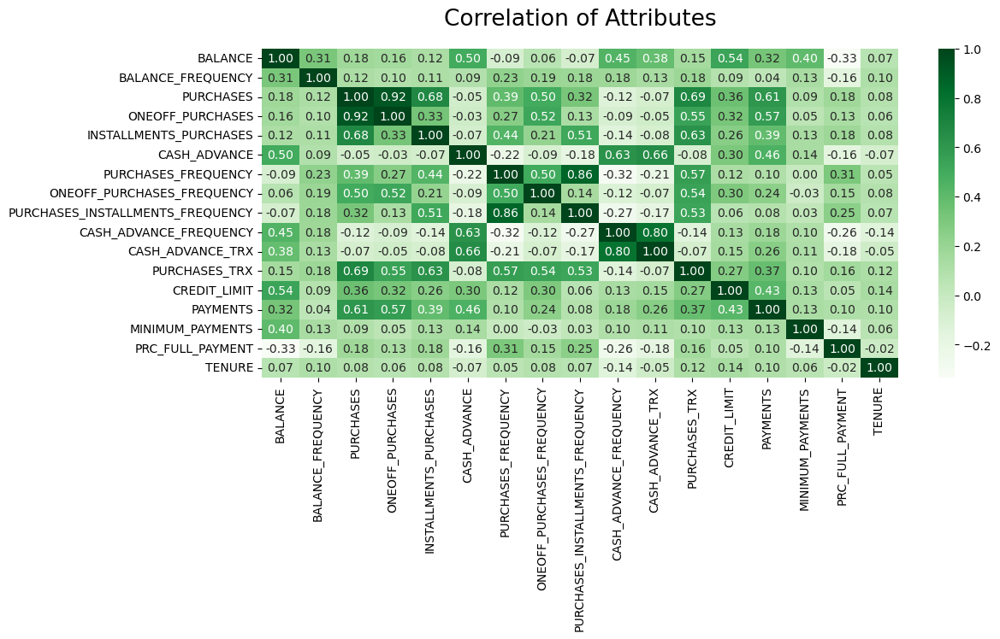

In [13]:
# correlation analysis

plt.figure(figsize = (12,5))
plt.title('Correlation of Attributes', y=1.05, size=19)
sns.heatmap(df2.corr(), cmap='Greens',annot=True, fmt='.2f')
plt.show()

In [14]:
######   Data Analysis

In [15]:
# for numerical features:

for column in numerical:
    fig = px.box(df2, x=df2[column])
    fig.show()

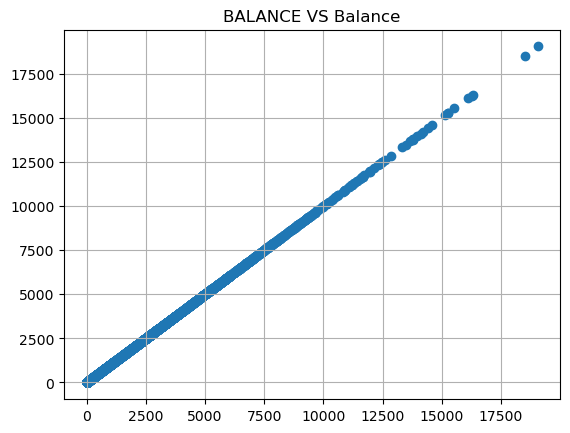

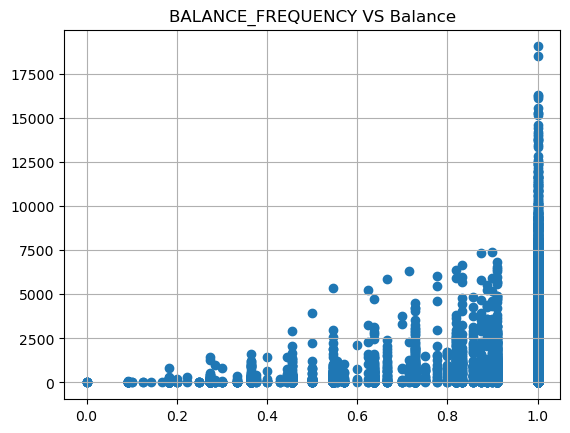

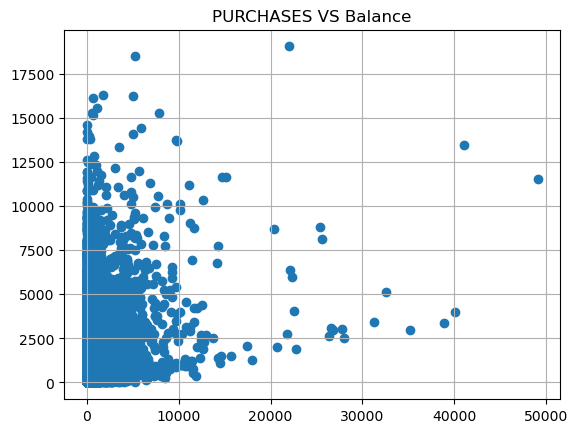

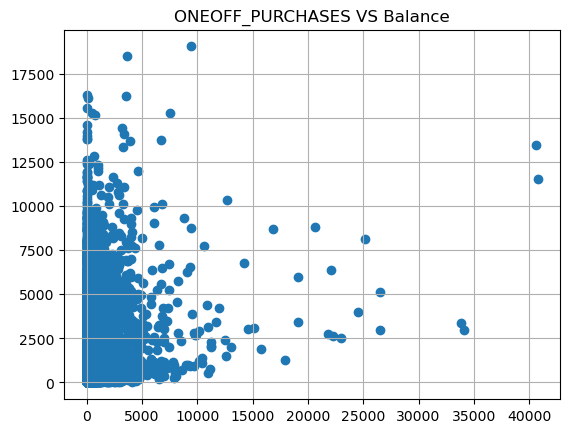

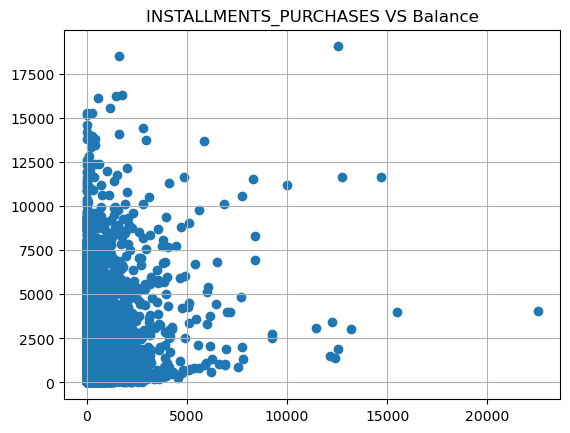

...

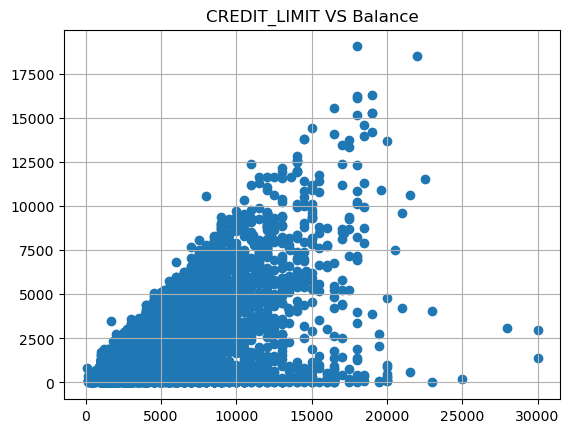

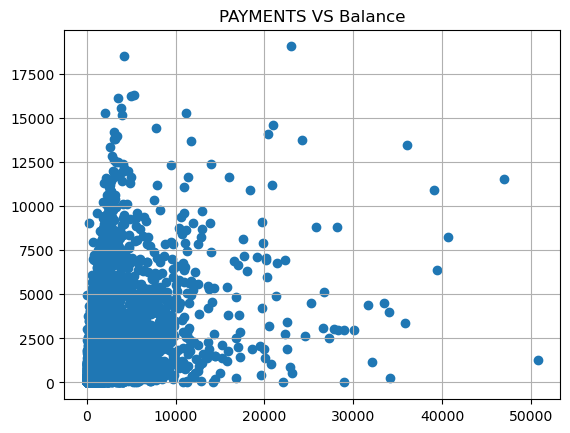

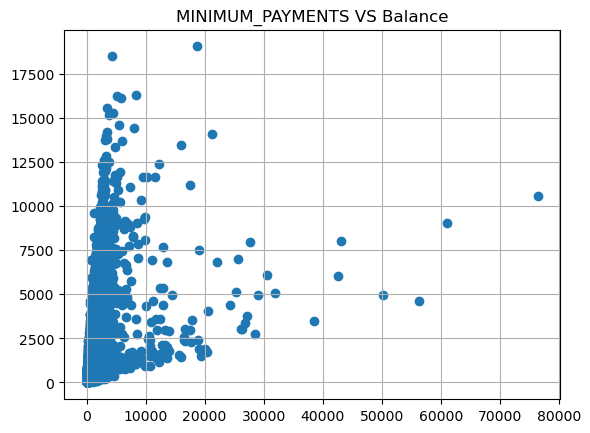

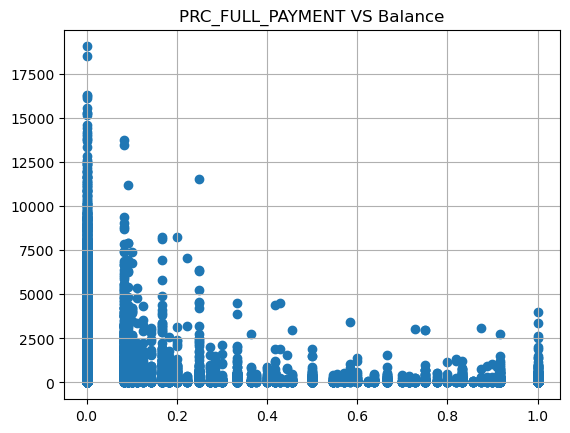

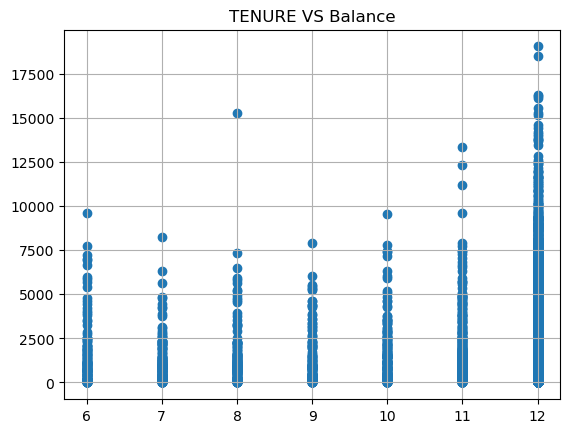

In [16]:
# we can analysis outliers used by 'box plots' (above) & 'scatter plots' (below) 

for col in df2.columns : 
    plt.scatter(df2[col], df2["BALANCE"])
    plt.title(col + ' VS Balance')
    plt.grid()
    plt.show()

In [17]:
# these are outliers :

out1 = df2[df2['BALANCE'] > 17500]
out2 = df2[df2['PURCHASES'] > 45000]
out3 = df2[df2['ONEOFF_PURCHASES'] > 30000]
out4 = df2[df2['INSTALLMENTS_PURCHASES'] > 20000]
out5 = df2[df2['CASH_ADVANCE'] > 30000]
out6 = df2[df2['CASH_ADVANCE_FREQUENCY'] > 1.4]
out7 = df2[df2['CASH_ADVANCE_TRX'] > 79]
out8 = df2[df2['CREDIT_LIMIT'] > 25000]
out9 = df2[df2['PAYMENTS'] > 45000]
out10 = df2[df2['MINIMUM_PAYMENTS'] > 35000]


outliers = pd.concat([out1, out2, out3, out4, out5, out6, out7, out8, out9, out10])     # make a dataframe from outliers
outliers

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
138,19043.138560,1.000000,22009.92,9449.07,12560.85,0.000000,1.000000,0.750000,1.000000,0.000000,0,216,18000.0,23018.575830,18621.013310,0.000000,12
4140,18495.558550,1.000000,5288.28,3657.30,1630.98,0.000000,1.000000,0.583333,1.000000,0.000000,0,76,22000.0,4246.168346,4227.081580,0.000000,12
550,11547.520010,1.000000,49039.57,40761.25,8278.32,558.166886,1.000000,1.000000,0.916667,0.083333,1,101,22500.0,46930.598240,2974.069421,0.250000,12
501,13479.288210,1.000000,41050.40,40624.06,426.34,0.000000,0.833333,0.666667,0.416667,0.000000,0,157,17000.0,36066.750680,15914.484620,0.083333,12
550,11547.520010,1.000000,49039.57,40761.25,8278.32,558.166886,1.000000,1.000000,0.916667,0.083333,1,101,22500.0,46930.598240,2974.069421,0.250000,12
1604,3391.702180,1.000000,38902.71,33803.84,5098.87,0.000000,1.000000,1.000000,1.000000,0.000000,0,195,18000.0,35843.625930,716.027656,1.000000,12
3937,2997.977825,1.000000,35131.16,34087.73,1043.43,0.000000,1.000000,1.000000,0.833333,0.000000,0,344,12000.0,28896.665220,767.014180,0.750000,12
5260,4060.710208,0.727273,22500.00,0.00,22500.00,0.000000,0.500000,0.000000,0.416667,0.000000,0,12,23000.0,8760.860264,1645.535202,0.000000,12
2159,10905.053810,1.000000,431.93,133.50,298.43,47137.211760,0.583333,0.250000,0.500000,1.000000,123,21,19600.0,39048.597620,5394.173671,0.000000,12
3038,3846.742530,1.000000,0.00,0.00,0.00,1932.460679,0.000000,0.000000,0.000000,1.500000,18,0,5600.0,496.245836,538.346874,0.000000,6


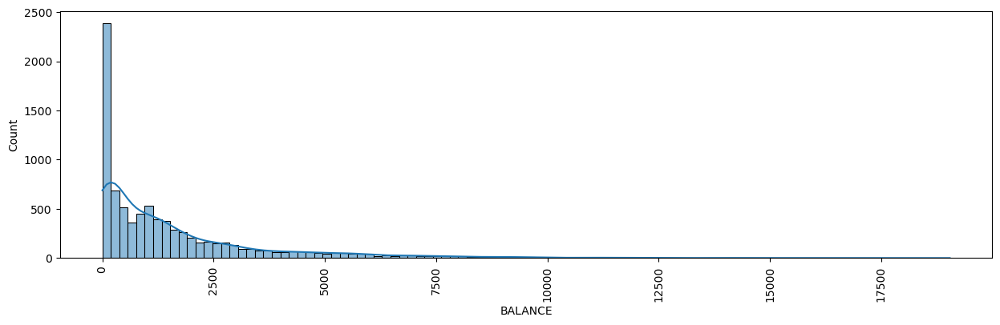

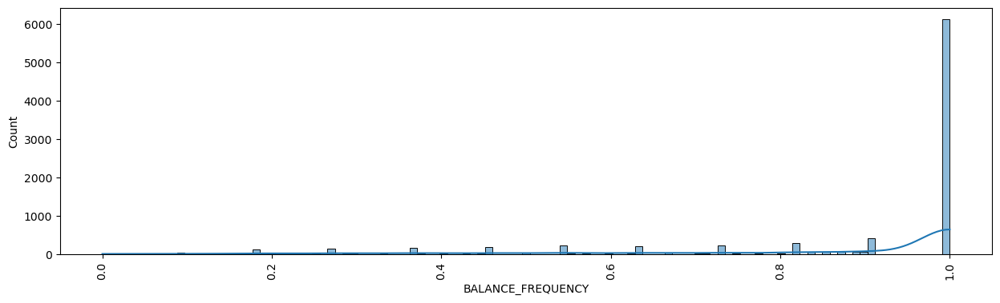

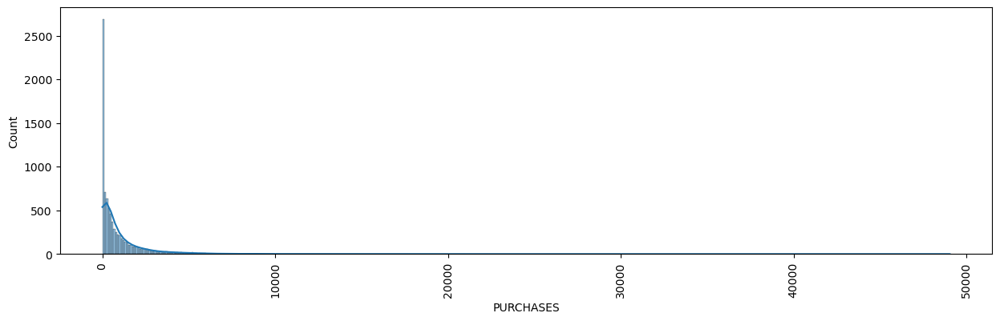

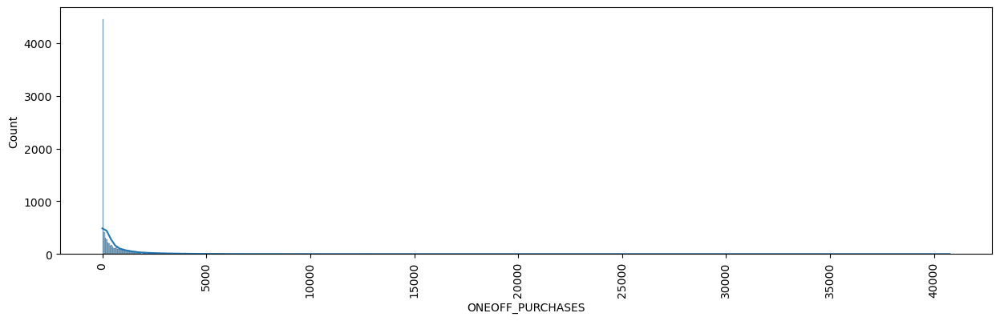

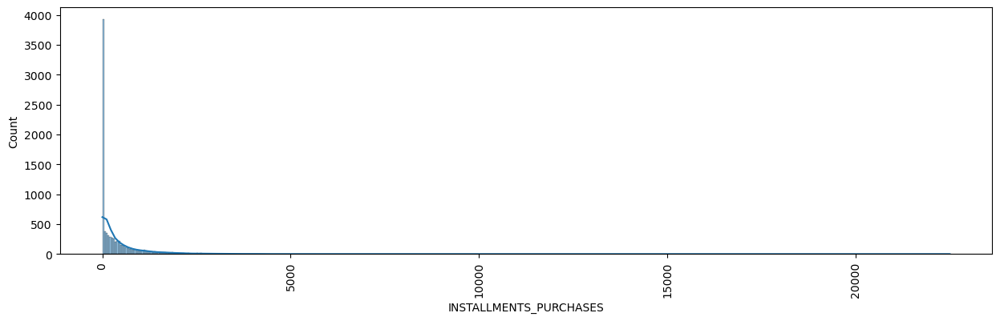

...

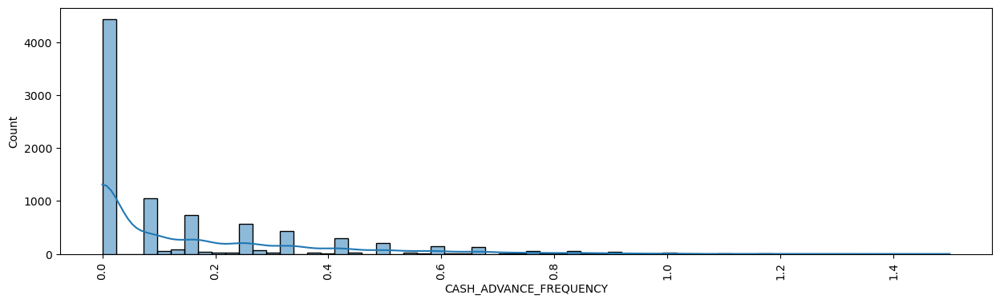

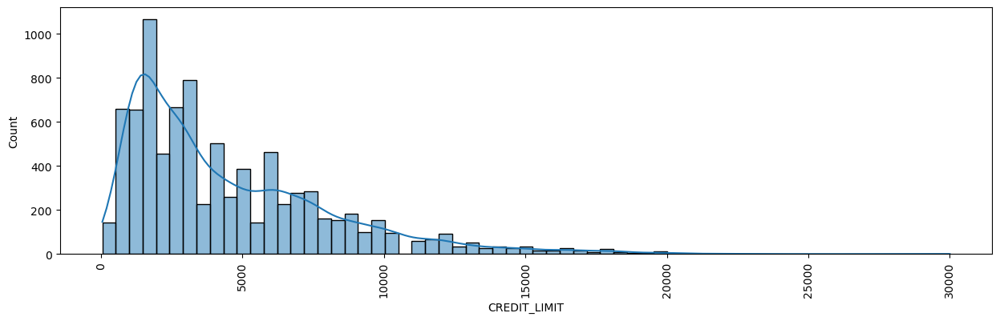

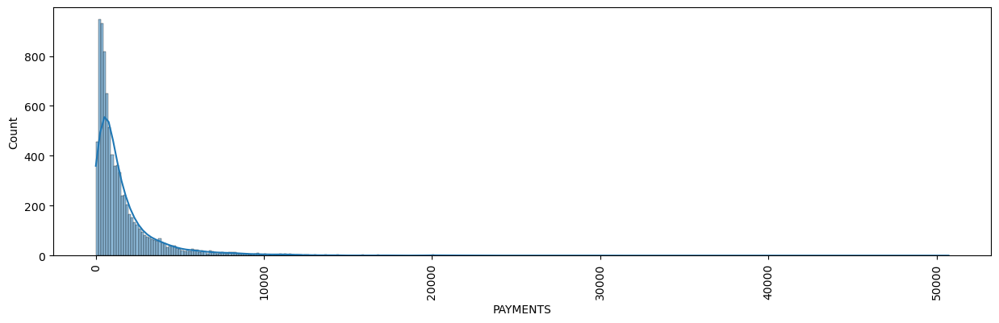

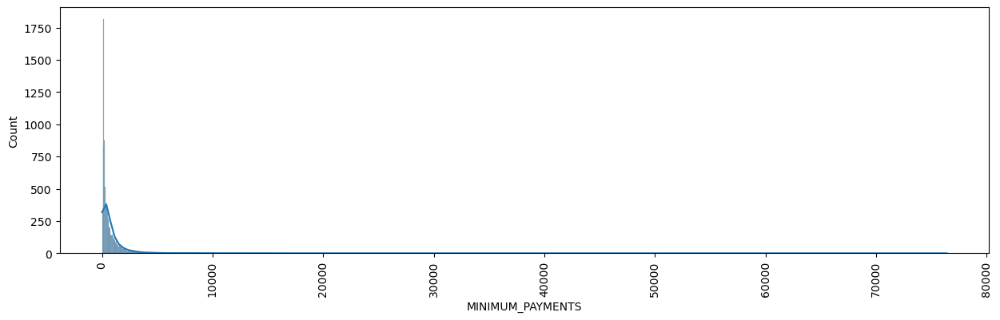

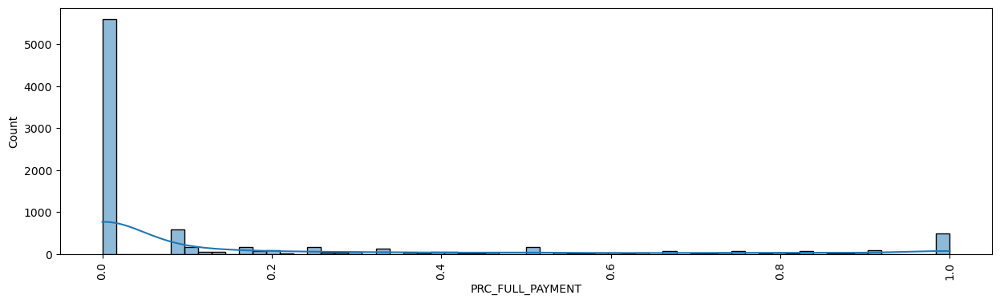

In [18]:
# analysis distribusion of numerical features

for i in numerical :
    plt.figure(figsize=(15,4))
    sns.histplot(df2[i], kde=True)
    plt.xticks(rotation=90)

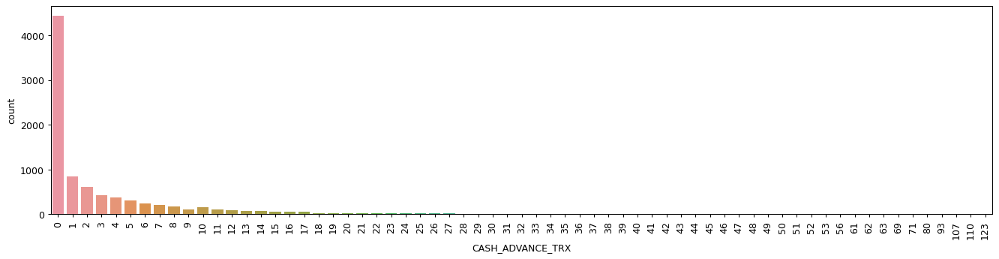

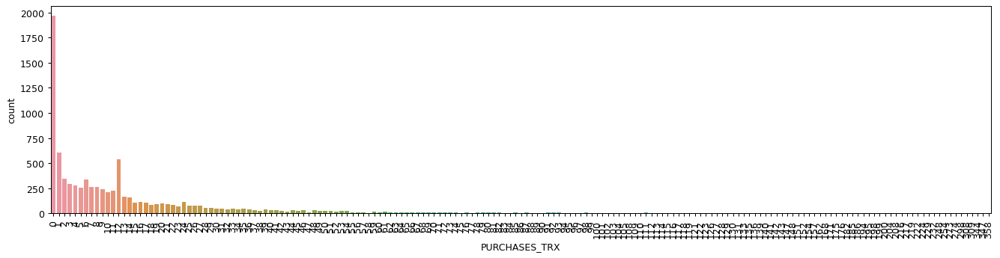

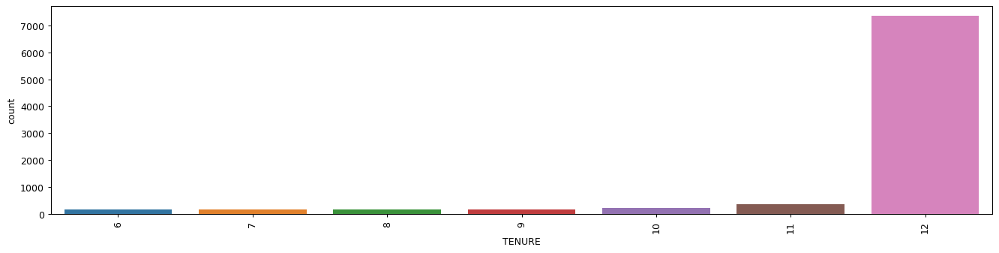

In [19]:
# analysis count of categorical features

for i in categorical :
    plt.figure(figsize=(18,4), dpi=90)
    sns.countplot(x=i, data=df2)
    plt.xticks(rotation=90)

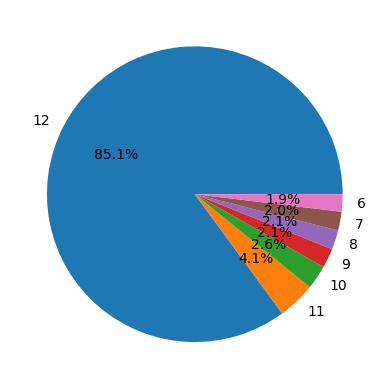

In [20]:
labelsTu = ['12','11','10','9','8','7','6']
valuesTu = df2['TENURE'].value_counts().values
fig, ax1 = plt.subplots()
ax1.pie(valuesTu, labels = labelsTu, autopct='%1.1f%%')
plt.show()

In [21]:
######   Modeling   ######

In [22]:
#### K-mean

In [23]:
# Set some initial values
kmeans_set = {"init":"random", "n_init":10,"max_iter":300,"random_state":42}

In [24]:
scaler = StandardScaler()
scaled_features = scaler.fit_transform(df2)

In [25]:
scaled_dataframe = pd.DataFrame(scaled_features, columns=df2.columns)  # Create a new dataframe with scaled values.

In [26]:
List = []
for k in range(1, 11):
    kmeans = KMeans(n_clusters=k, **kmeans_set)  # The ** syntax is used to unpack the dictionary.
    kmeans.fit(scaled_dataframe)
    List.append(kmeans.inertia_)

In [27]:
k = KneeLocator(range(1,11), List, curve='convex', direction='decreasing')
k.elbow

4

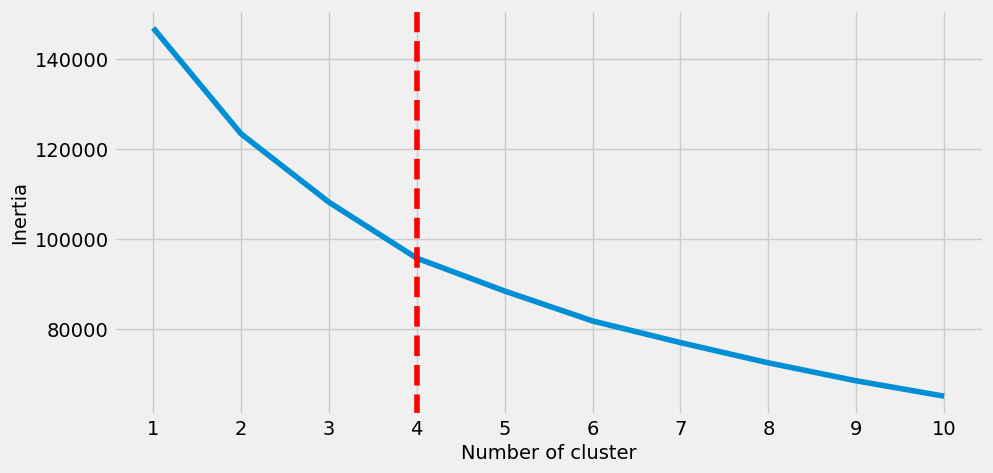

In [28]:
plt.style.use('fivethirtyeight')
plt.figure(figsize = (10, 5))
plt.plot(range(1, 11), List)
plt.xticks(range(1, 11))
plt.xlabel('Number of cluster')
plt.ylabel('Inertia')
plt.axvline(x=k.elbow, color='r', label="anxline - full height", ls='--')
plt.show()

In [29]:
### The best value of k using this method is equal to 4.

In [30]:
silhouette_coefficients = []                 # holds the silhouette coefficients for each k
for k in range(2,11):                        # Note that you have to start with 2 clusters for the silhouette coefficien.
    kmeans = KMeans(n_clusters=k, **kmeans_set)
    kmeans.fit(scaled_dataframe)
    score = silhouette_score(scaled_dataframe, kmeans.labels_)
    silhouette_coefficients.append(score)

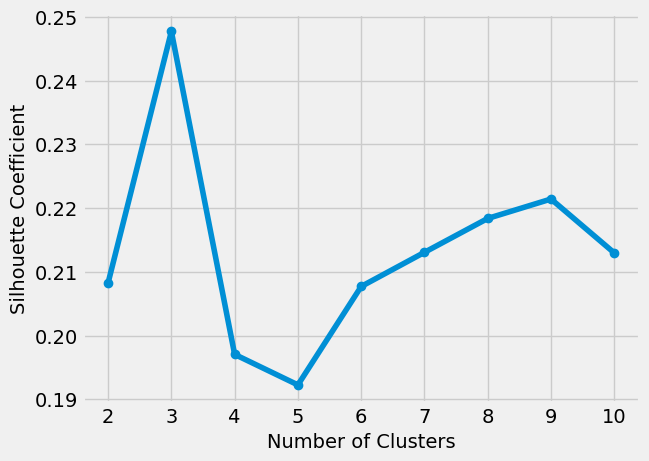

In [31]:
plt.style.use("fivethirtyeight")
plt.plot(range(2, 11), silhouette_coefficients, marker='o')
plt.xticks(range(2, 11))
plt.xlabel("Number of Clusters")
plt.ylabel("Silhouette Coefficient")
plt.show()

In [32]:
###   The best value of k using this method is equal to 3.

In [33]:
calinski_Harabasz_coefs = []   # holds the calinski_Harabaz coefficients for each k
for k in range(2,11):          # Note that you have to start with 2 clusters for the Calinski_Harabasz Coefficient.
    kmeans = KMeans(n_clusters=k, **kmeans_set)
    kmeans.fit(scaled_dataframe)
    score = calinski_harabasz_score(scaled_dataframe, kmeans.labels_)
    calinski_Harabasz_coefs.append(score)

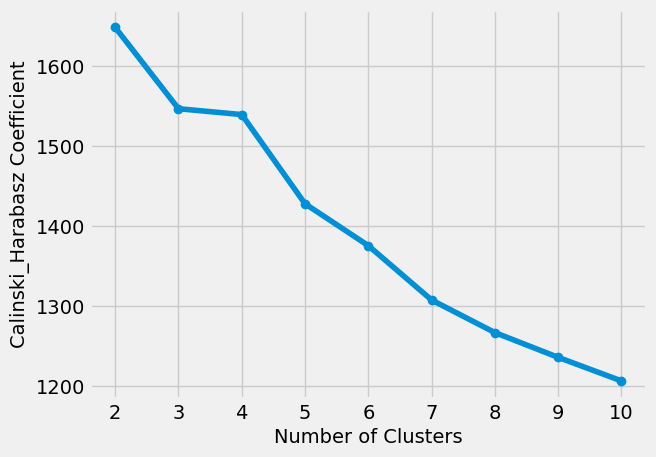

In [34]:
plt.style.use("fivethirtyeight")
plt.plot(range(2, 11), calinski_Harabasz_coefs, marker='o')
plt.xticks(range(2, 11))
plt.xlabel("Number of Clusters")
plt.ylabel("Calinski_Harabasz Coefficient")
plt.show()

In [35]:
### The best value of k using this method is equal to 3.

[[-0.36809632 -0.16964136 -0.23339773 -0.20454113 -0.1758135  -0.31269431
  -0.05884094 -0.23353732 -0.04753166 -0.33703421 -0.30188951 -0.24460683
  -0.34229087 -0.28801372 -0.13633962  0.01503539 -0.02337154]
 [ 0.30832219  0.42001262  1.5099337   1.26153715  1.25108977 -0.24791809
   1.13358118  1.53595225  0.95838728 -0.36263703 -0.25342148  1.66762018
   0.8893863   0.82418004  0.16930037  0.47063274  0.29543716]
 [ 1.14271991  0.31067415 -0.29684311 -0.21218734 -0.31194948  1.36690497
  -0.65990288 -0.31653703 -0.56623523  1.54745243  1.33060639 -0.37728253
   0.59428797  0.44113134  0.3804366  -0.42217485 -0.14180736]]


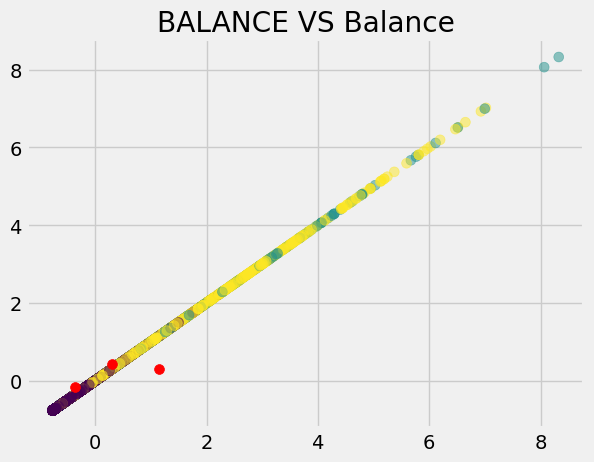

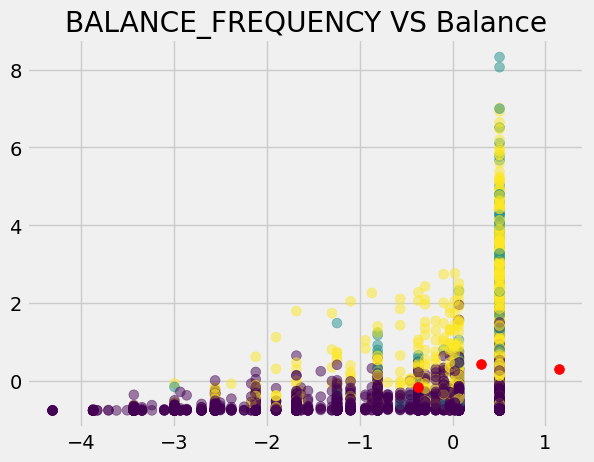

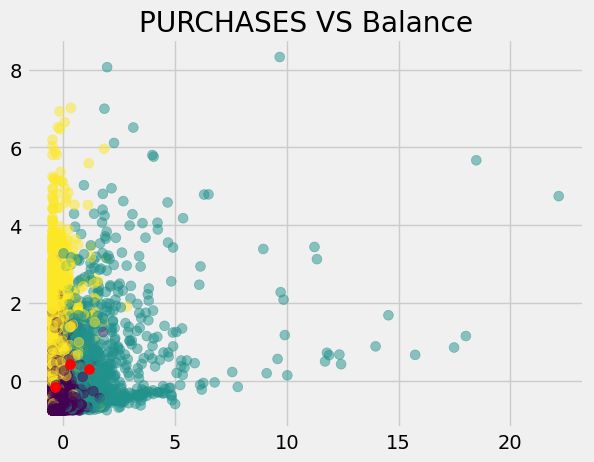

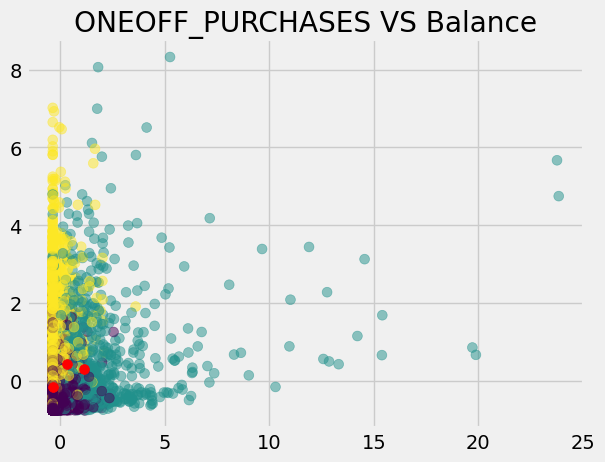

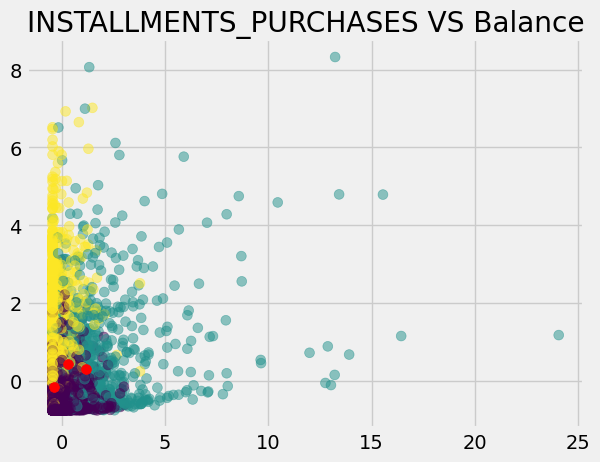

...

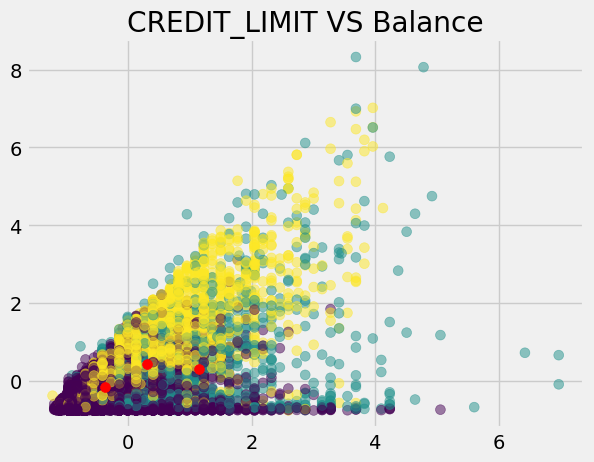

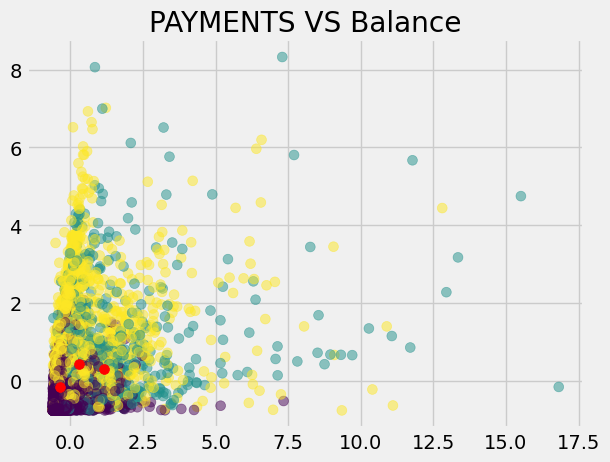

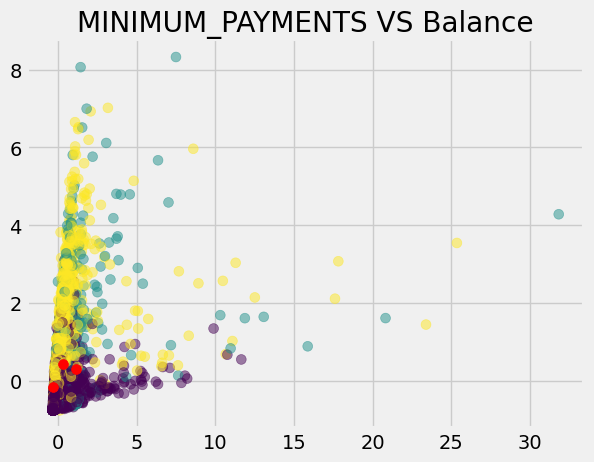

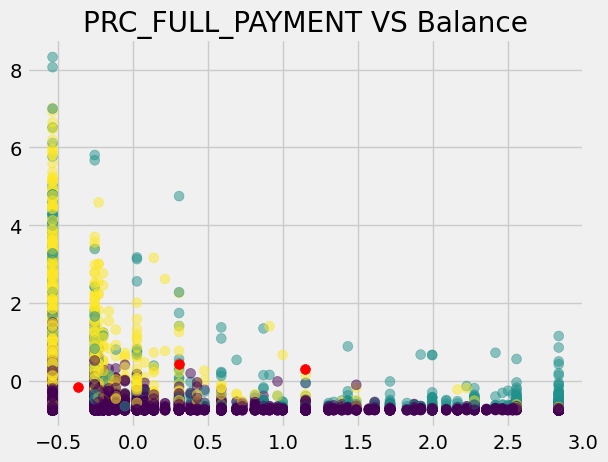

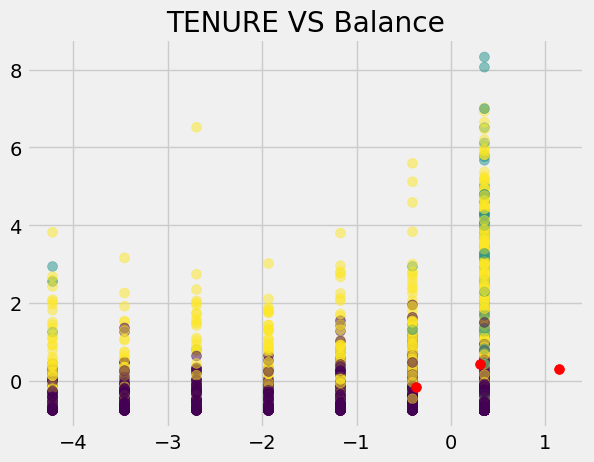

In [36]:
# finally n_cluster = 3 is the best

kmeans = KMeans(n_clusters=3)
kmeans.fit(scaled_features)
centroids = kmeans.cluster_centers_
print(centroids)

for column in scaled_dataframe.columns : 
    plt.scatter(scaled_dataframe[column], scaled_dataframe["BALANCE"], c = kmeans.labels_.astype(float), s=50, alpha=0.5)
    plt.scatter(centroids[:,0], centroids[:,1], c = 'red', s=50)   
    plt.title(column + ' VS Balance')
    plt.show()

In [37]:
###   Mini Batch KMeans

In [38]:
Inertias_mb = []
for k in range(1, 11):
    mbKmeans = MiniBatchKMeans(n_clusters=k, random_state=42)
    mbKmeans.fit(scaled_dataframe)
    Inertias_mb.append(mbKmeans.inertia_)

In [39]:
#  elbow

k2 = KneeLocator(range(1, 11), Inertias_mb, curve = 'convex', direction = 'decreasing')
k2.elbow

4

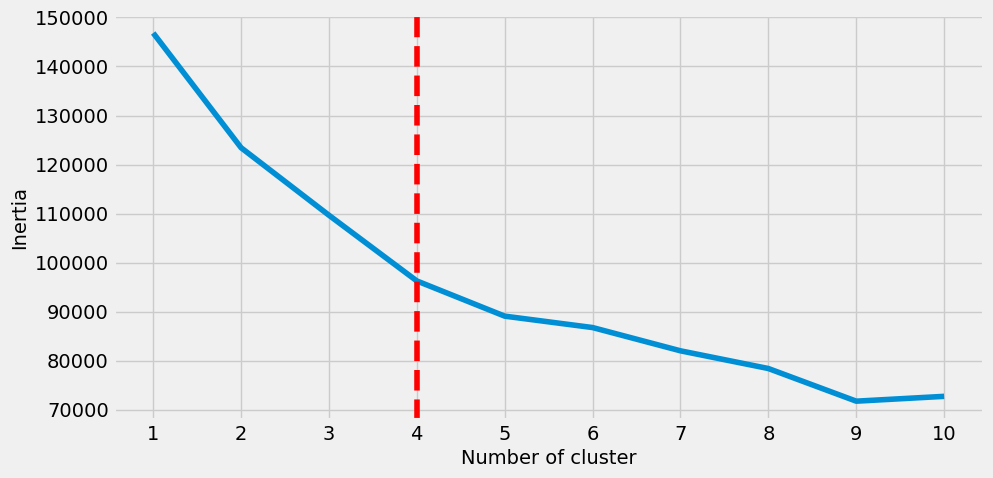

In [40]:
plt.style.use('fivethirtyeight')
plt.figure(figsize = (10, 5))
plt.plot(range(1, 11), Inertias_mb)
plt.xticks(range(1, 11))
plt.xlabel('Number of cluster')
plt.ylabel('Inertia')
plt.axvline(x=k2.elbow, color='r', label="anxline - full height", ls='--')
plt.show()

In [41]:
### The best value of k using this method is equal to 4.

In [42]:
silhouette_coefficients = []
for k in range(2, 11):
    mbKmeans = MiniBatchKMeans(n_clusters=k, random_state=42)
    mbKmeans.fit(scaled_dataframe)
    score = silhouette_score(scaled_dataframe, mbKmeans.labels_)
    silhouette_coefficients.append(score)

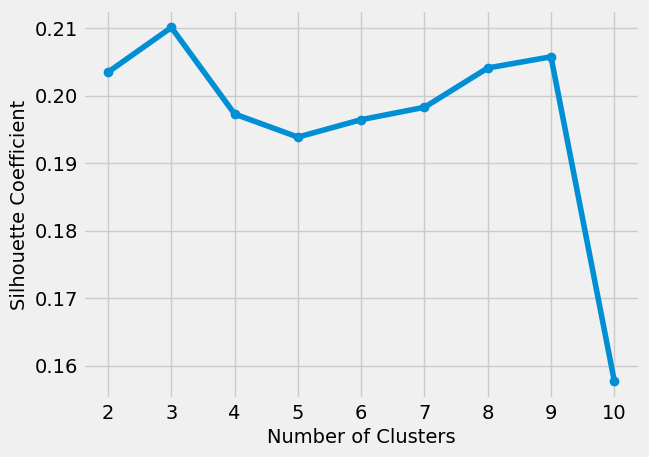

In [43]:
plt.style.use("fivethirtyeight")
plt.plot(range(2, 11), silhouette_coefficients, marker='o')
plt.xticks(range(2, 11))
plt.xlabel("Number of Clusters")
plt.ylabel("Silhouette Coefficient")
plt.show()

In [44]:
###   The best value of k using this method is equal to 3.

In [45]:
calinski_harabaz_coef = []
for k in range(2, 11):
    mbKmeans = MiniBatchKMeans(n_clusters=k, random_state=42)
    mbKmeans.fit(scaled_dataframe)
    score = calinski_harabasz_score(scaled_dataframe, mbKmeans.labels_)
    calinski_harabaz_coef.append(score)

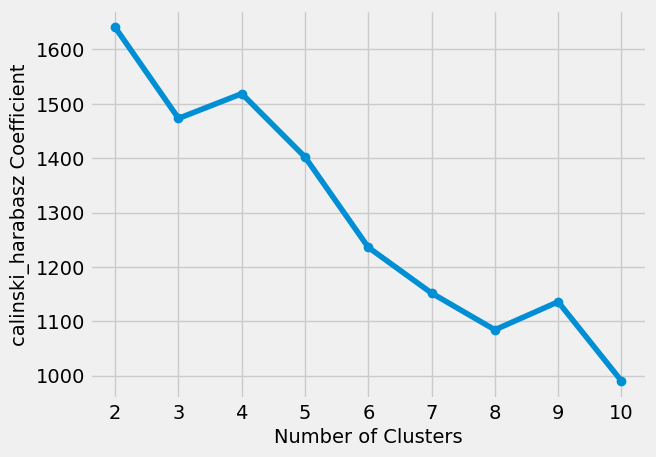

In [46]:
plt.style.use("fivethirtyeight")
plt.plot(range(2, 11), calinski_harabaz_coef, marker='o')
plt.xticks(range(2, 11))
plt.xlabel("Number of Clusters")
plt.ylabel("calinski_harabasz Coefficient")
plt.show()

In [47]:
### The best value of k using this method is equal to 3 or 4.
# we can try both of them

[[-0.30888387 -0.33880006 -0.28975537 -0.17283142 -0.36727618 -0.2815392
  -0.59728513 -0.16530772 -0.65681115 -0.27782215 -0.27751738 -0.40589535
  -0.31945019 -0.2778703  -0.14724562 -0.25617596  0.03523046]
 [ 1.02707235  0.29887366 -0.32519626 -0.23384947 -0.33916326  1.29860206
  -0.73284082 -0.35617522 -0.6328028   1.52606871  1.31622156 -0.417013
   0.48897093  0.34251204  0.34924172 -0.42268369 -0.18641157]
 [-0.46129658  0.12626629 -0.03226079 -0.18504191  0.26381218 -0.39825703
   0.98063116 -0.13514303  1.07600466 -0.51731562 -0.38980922  0.16977724
  -0.25340918 -0.23784058 -0.11616408  0.58683521 -0.02378207]
 [ 0.60415042  0.41996807  1.80701629  1.60226577  1.32786581 -0.12968924
   1.12519792  1.73320973  0.93681541 -0.23752038 -0.13461247  1.97617416
   1.13062312  1.05056135  0.29136217  0.30856938  0.27263244]]


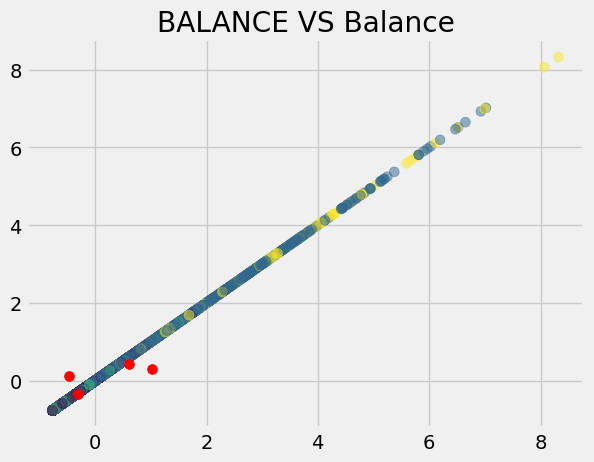

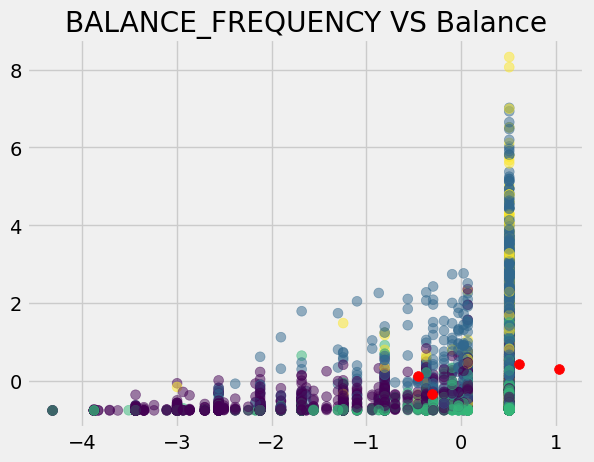

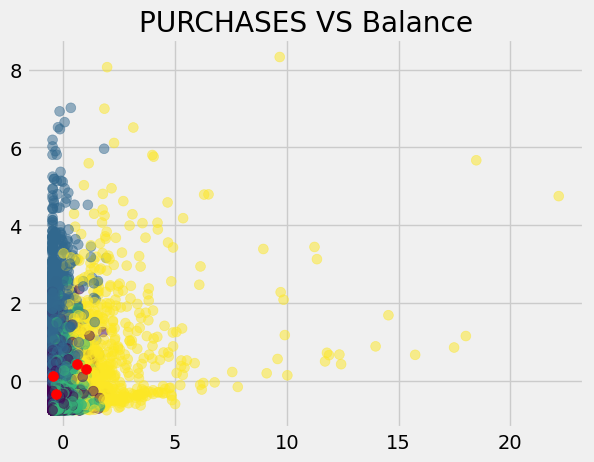

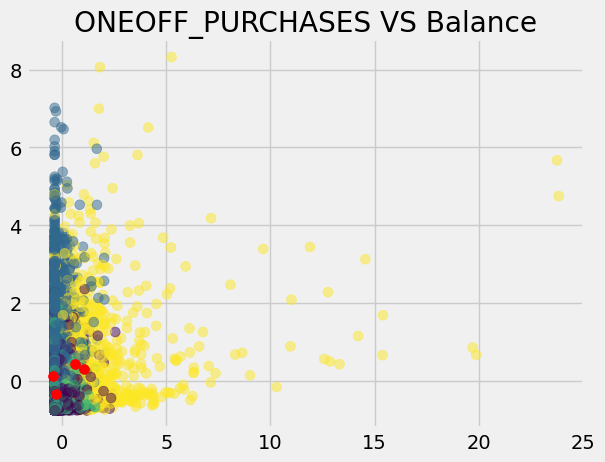

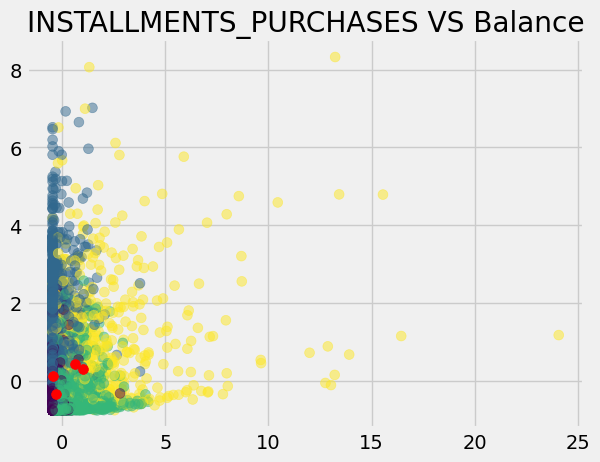

...

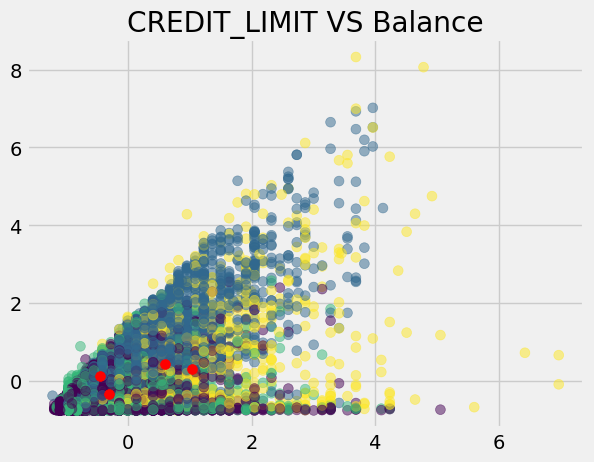

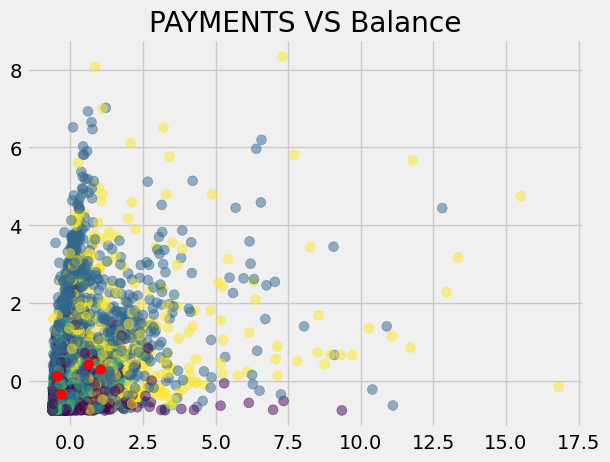

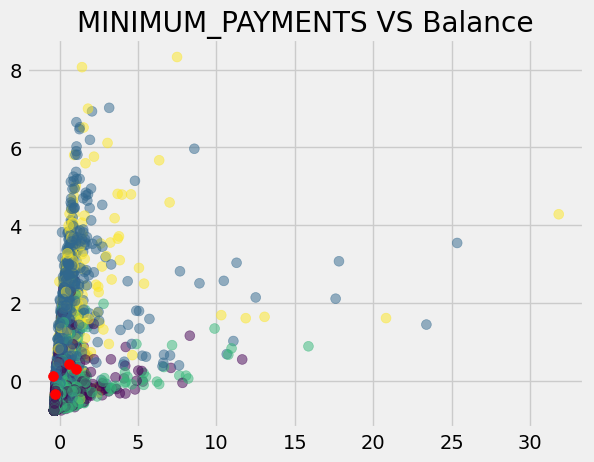

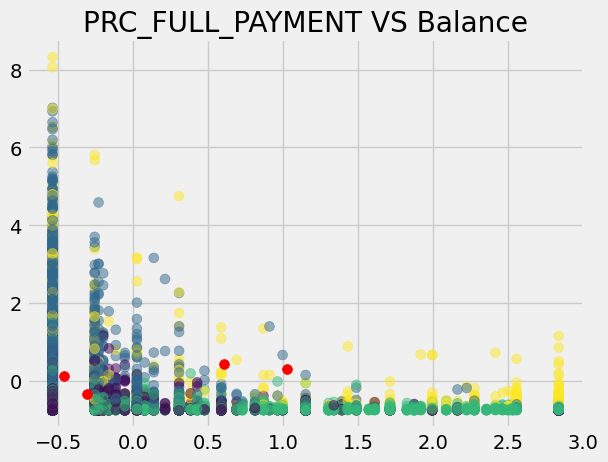

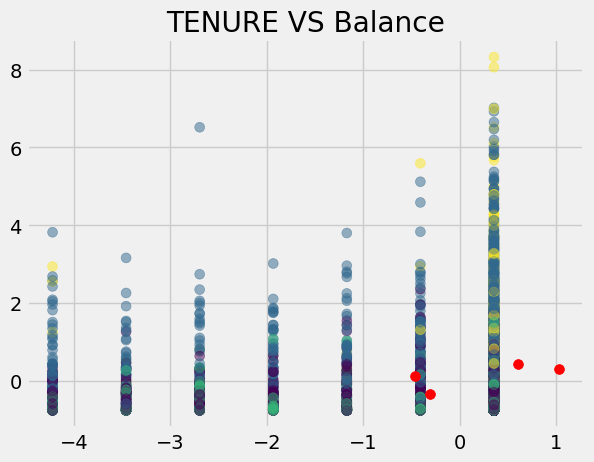

In [48]:
mbkmeans = MiniBatchKMeans(n_clusters=4)     # n_cluster = 4
mbkmeans.fit(scaled_features)
centroids = mbkmeans.cluster_centers_
print(centroids)

for column in scaled_dataframe.columns : 
    plt.scatter(scaled_dataframe[column], scaled_dataframe["BALANCE"], c = mbkmeans.labels_.astype(float), s=50, alpha=0.5)
    plt.scatter(centroids[:,0], centroids[:,1], c = 'red', s=50)
    plt.title(column + ' VS Balance')
    plt.show()

[[-0.11391198  0.38902099  0.49601458  0.34685711  0.53496545 -0.33147845
   1.05105709  0.58171855  0.93636908 -0.43493787 -0.33175506  0.68469176
   0.14474186  0.1214871  -0.00720741  0.3541256   0.13951759]
 [ 0.93965373  0.34828234 -0.30391546 -0.20786275 -0.33664901  1.11645841
  -0.70822422 -0.32930683 -0.61683612  1.33598553  1.11718169 -0.40208354
   0.39610149  0.29581593  0.32690625 -0.43336082 -0.14396306]
 [-0.42566478 -0.57761639 -0.32200591 -0.22863663 -0.34054925 -0.30641585
  -0.58511424 -0.36528141 -0.53055731 -0.35400746 -0.31474524 -0.42752716
  -0.38879006 -0.30014704 -0.18943925 -0.09708567 -0.07274661]]


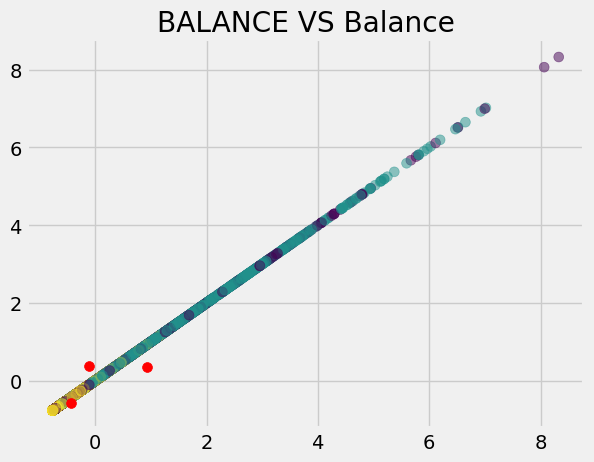

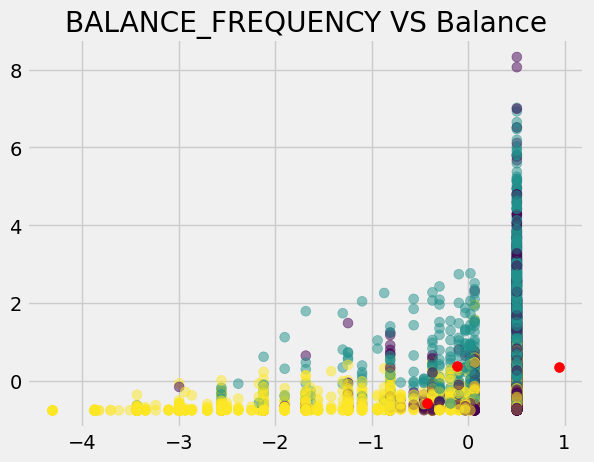

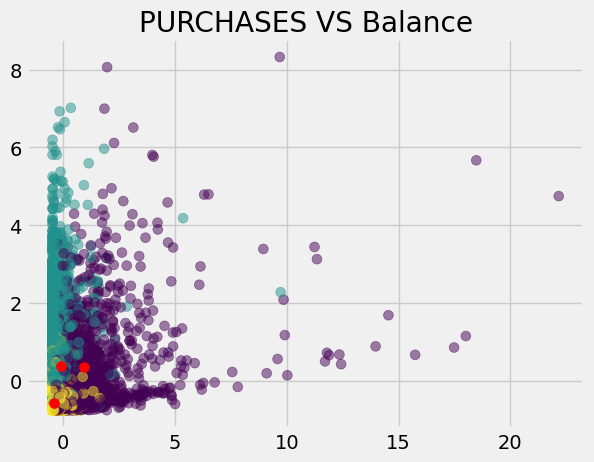

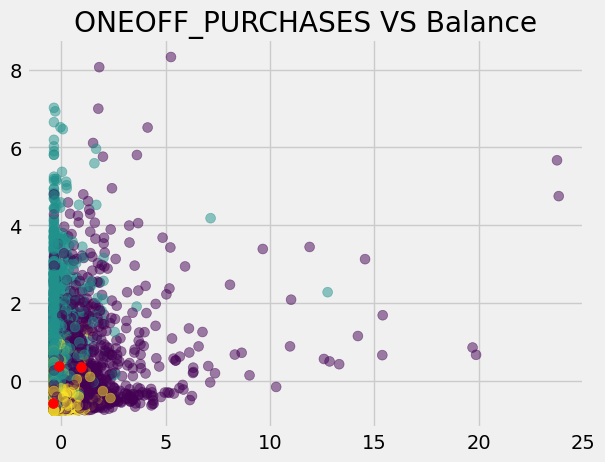

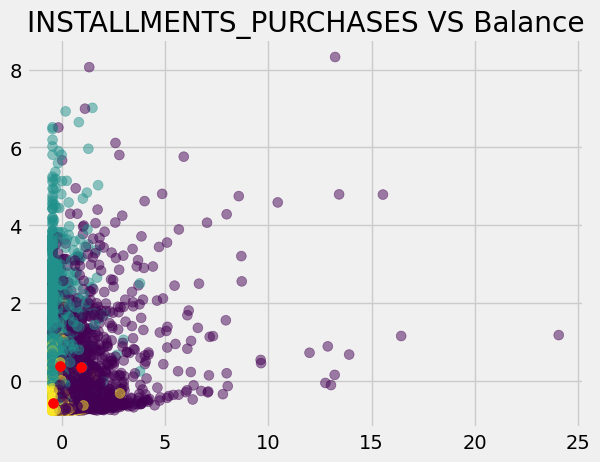

...

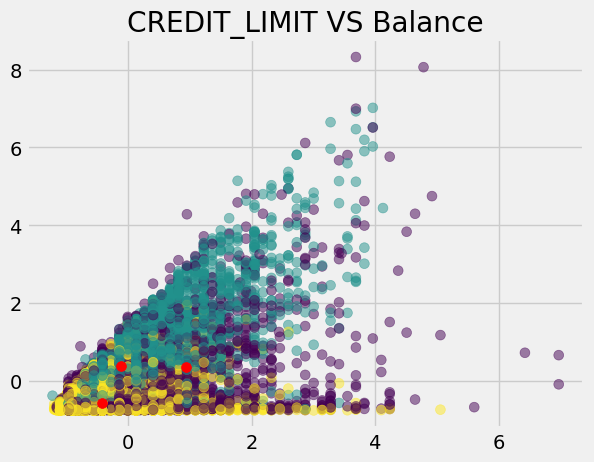

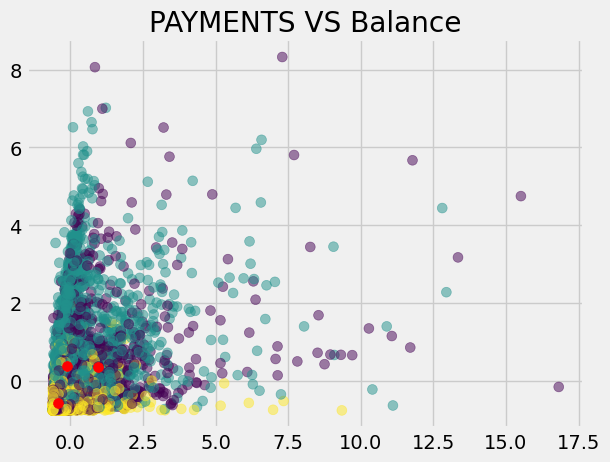

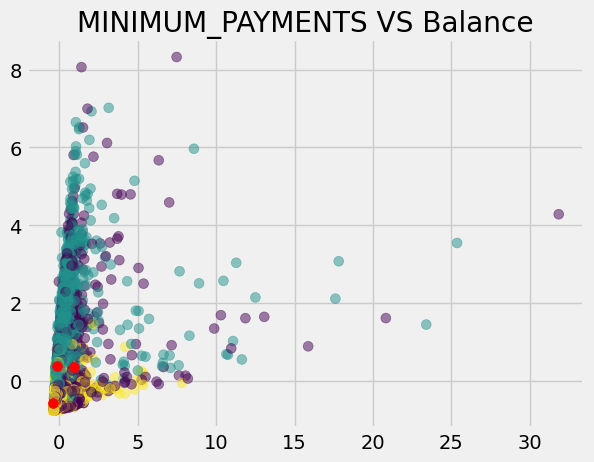

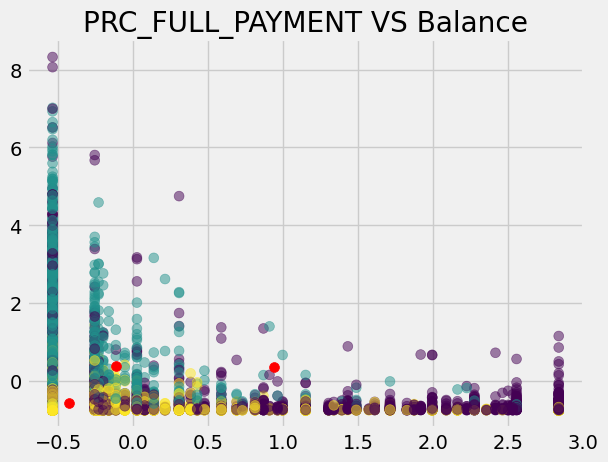

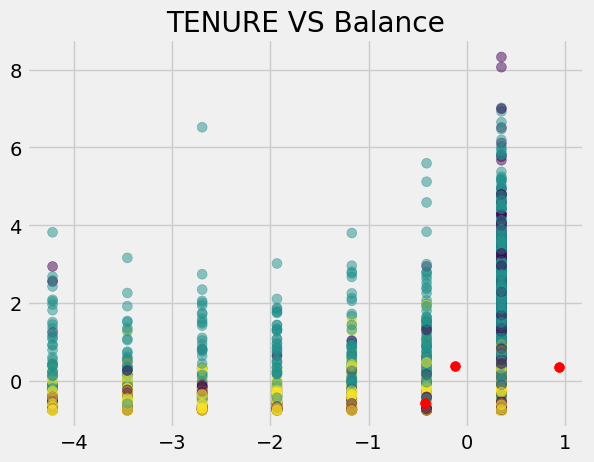

In [49]:
# after checking their plots, we found that forth cluster is not suitable and it seems to be out of range
# so n_cluster = 3 is the best

mbkmeans = MiniBatchKMeans(n_clusters=3)     # n_cluster = 3
mbkmeans.fit(scaled_features)
centroids = mbkmeans.cluster_centers_
print(centroids)

for column in scaled_dataframe.columns : 
    plt.scatter(scaled_dataframe[column], scaled_dataframe["BALANCE"], c = mbkmeans.labels_.astype(float), s=50, alpha=0.5)
    plt.scatter(centroids[:,0], centroids[:,1], c = 'red', s=50)
    plt.title(column + ' VS Balance')
    plt.show()

In [50]:
#  go for outliers

df_without_out = df2.copy()      # make a copy from base dataframe

In [51]:
df_without_out.drop(index=outliers.index, inplace=True)    # creat a dataframe without outliers
df_without_out.reset_index(inplace=True, drop=True)
df_without_out

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,40.900749,0.818182,95.40,0.00,95.40,0.000000,0.166667,0.000000,0.083333,0.000000,0,2,1000.0,201.802084,139.509787,0.000000,12
1,3202.467416,0.909091,0.00,0.00,0.00,6442.945483,0.000000,0.000000,0.000000,0.250000,4,0,7000.0,4103.032597,1072.340217,0.222222,12
2,2495.148862,1.000000,773.17,773.17,0.00,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,7500.0,622.066742,627.284787,0.000000,12
3,817.714335,1.000000,16.00,16.00,0.00,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,1200.0,678.334763,244.791237,0.000000,12
4,1809.828751,1.000000,1333.28,0.00,1333.28,0.000000,0.666667,0.000000,0.583333,0.000000,0,8,1800.0,1400.057770,2407.246035,0.000000,12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8605,5.871712,0.500000,20.90,20.90,0.00,0.000000,0.166667,0.166667,0.000000,0.000000,0,1,500.0,58.644883,43.473717,0.000000,6
8606,28.493517,1.000000,291.12,0.00,291.12,0.000000,1.000000,0.000000,0.833333,0.000000,0,6,1000.0,325.594462,48.886365,0.500000,6
8607,23.398673,0.833333,144.40,0.00,144.40,0.000000,0.833333,0.000000,0.666667,0.000000,0,5,1000.0,81.270775,82.418369,0.250000,6
8608,13.457564,0.833333,0.00,0.00,0.00,36.558778,0.000000,0.000000,0.000000,0.166667,2,0,500.0,52.549959,55.755628,0.250000,6


In [52]:
scaler2 = StandardScaler()
scaled_features2 = scaler2.fit_transform(df_without_out)

In [53]:
scaled_dataframe2 = pd.DataFrame(scaled_features2, columns=df_without_out.columns)  # Create a new dataframe with scaled values.

In [54]:
List2 = []
for k in range(1, 11):
    kmeans2 = KMeans(n_clusters=k, **kmeans_set)  # The ** syntax is used to unpack the dictionary.
    kmeans2.fit(scaled_dataframe2)
    List2.append(kmeans2.inertia_)

In [55]:
k2 = KneeLocator(range(1,11), List2, curve='convex', direction='decreasing')
k2.elbow

4

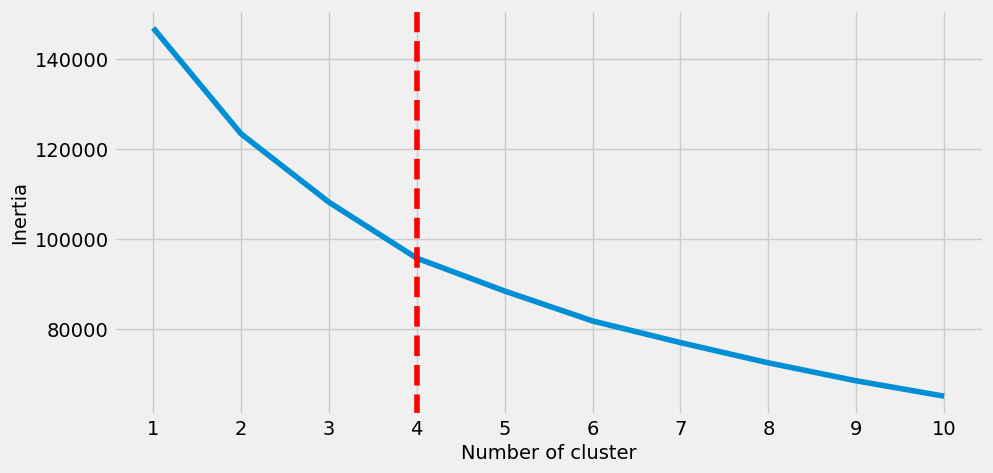

In [56]:
plt.style.use('fivethirtyeight')
plt.figure(figsize = (10, 5))
plt.plot(range(1, 11), List)
plt.xticks(range(1, 11))
plt.xlabel('Number of cluster')
plt.ylabel('Inertia')
plt.axvline(x=k2.elbow, color='r', label="anxline - full height", ls='--')
plt.show()

In [57]:
### The best value of k using this method is equal to 4.

In [58]:
silhouette_coefficients2 = []                 # holds the silhouette coefficients for each k
for k in range(2,11):                        # Note that you have to start with 2 clusters for the silhouette coefficien.
    kmeans2 = KMeans(n_clusters=k, **kmeans_set)
    kmeans2.fit(scaled_dataframe2)
    score2 = silhouette_score(scaled_dataframe2, kmeans2.labels_)
    silhouette_coefficients2.append(score2)

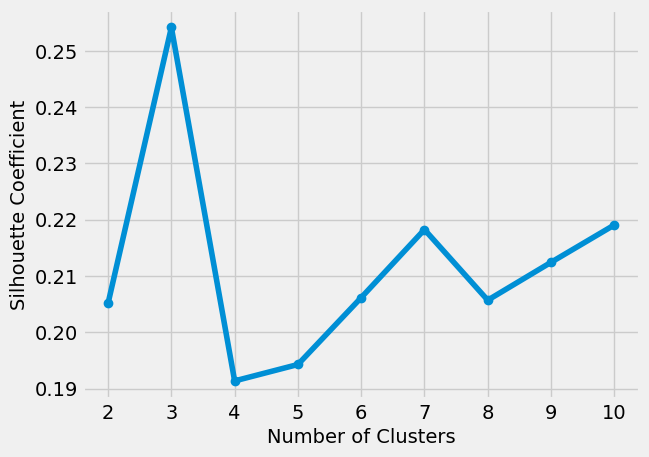

In [59]:
plt.style.use("fivethirtyeight")
plt.plot(range(2, 11), silhouette_coefficients2, marker='o')
plt.xticks(range(2, 11))
plt.xlabel("Number of Clusters")
plt.ylabel("Silhouette Coefficient")
plt.show()

In [60]:
###   The best value of k using this method is equal to 3.

In [61]:
calinski_Harabasz_coefs2 = []   # holds the calinski_Harabaz coefficients for each k
for k in range(2,11):          # Note that you have to start with 2 clusters for the Calinski_Harabasz Coefficient.
    kmeans2 = KMeans(n_clusters=k, **kmeans_set)
    kmeans2.fit(scaled_dataframe2)
    score2 = calinski_harabasz_score(scaled_dataframe2, kmeans2.labels_)
    calinski_Harabasz_coefs2.append(score2)

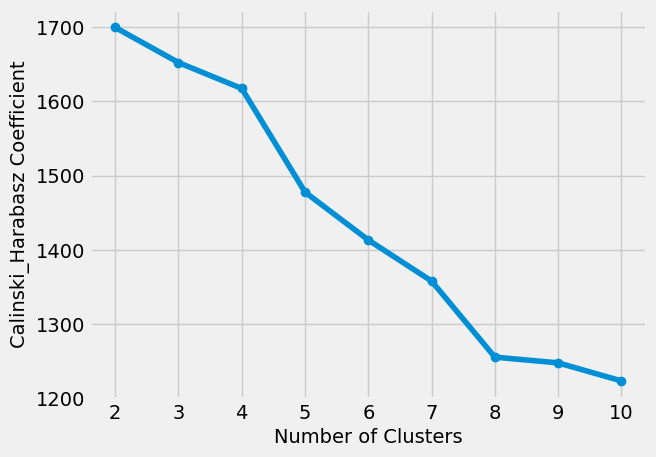

In [62]:
plt.style.use("fivethirtyeight")
plt.plot(range(2, 11), calinski_Harabasz_coefs2, marker='o')
plt.xticks(range(2, 11))
plt.xlabel("Number of Clusters")
plt.ylabel("Calinski_Harabasz Coefficient")
plt.show()

In [63]:
### The best value of k using this method is equal to 3.

[[ 1.17954927  0.3111131  -0.31080993 -0.22995095 -0.30702142  1.40893596
  -0.6351471  -0.30925765 -0.54268004  1.55497091  1.44537801 -0.36157694
   0.61898831  0.49976979  0.5405847  -0.4202058  -0.12643292]
 [ 0.26552026  0.42056954  1.6149146   1.39647862  1.25676815 -0.26314102
   1.1196267   1.54104938  0.92697509 -0.37486247 -0.29152368  1.64459304
   0.85761888  0.81154285  0.11664308  0.48106034  0.29268671]
 [-0.36489053 -0.1695002  -0.25597186 -0.23153087 -0.18211715 -0.3145754
  -0.06738767 -0.24094205 -0.05138016 -0.32953239 -0.31820263 -0.24885794
  -0.34159517 -0.30069438 -0.1661743   0.00968542 -0.02800433]]


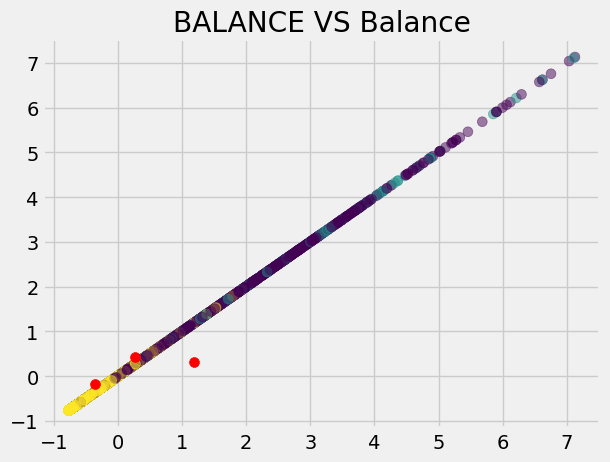

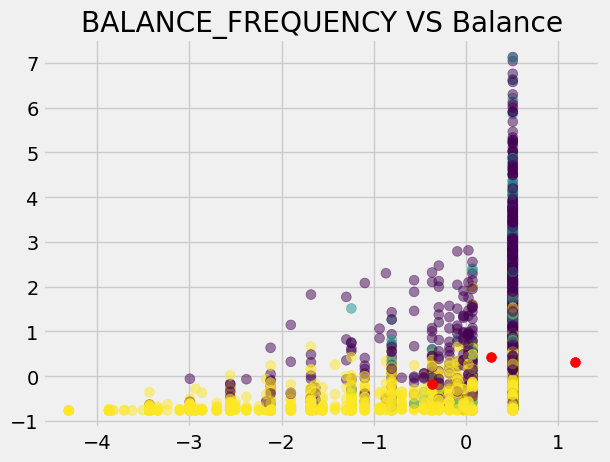

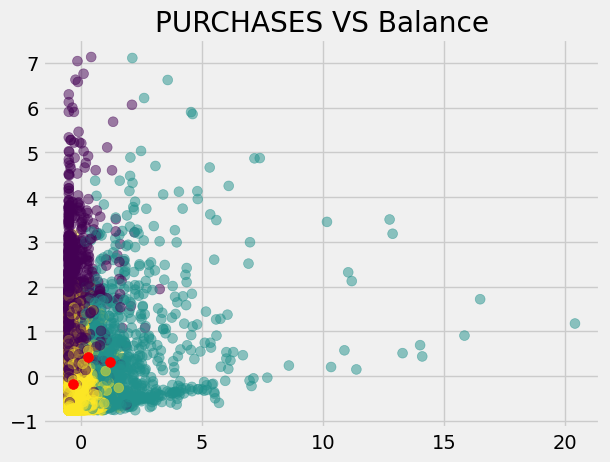

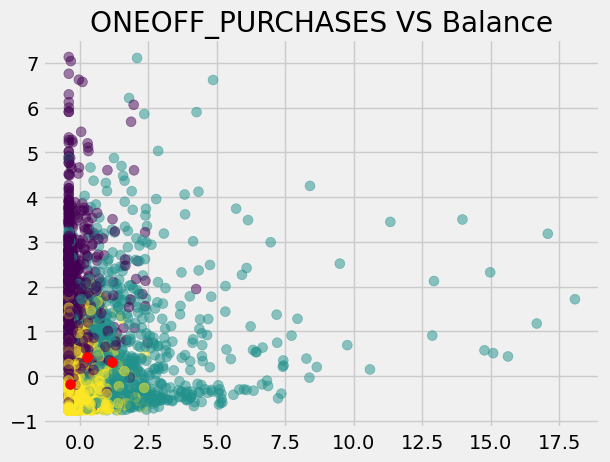

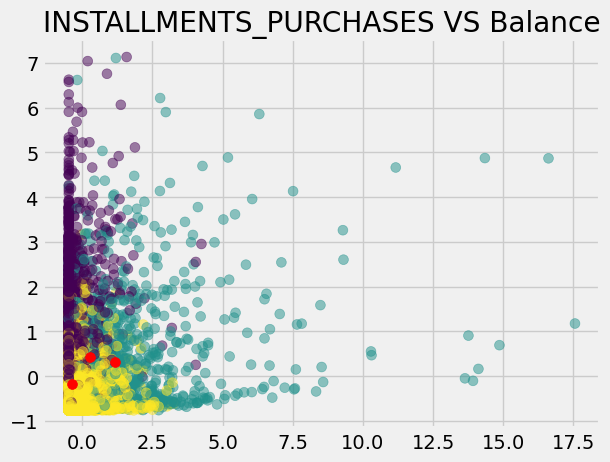

...

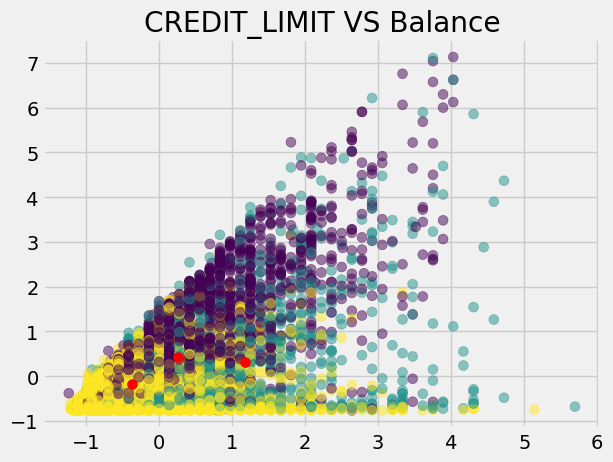

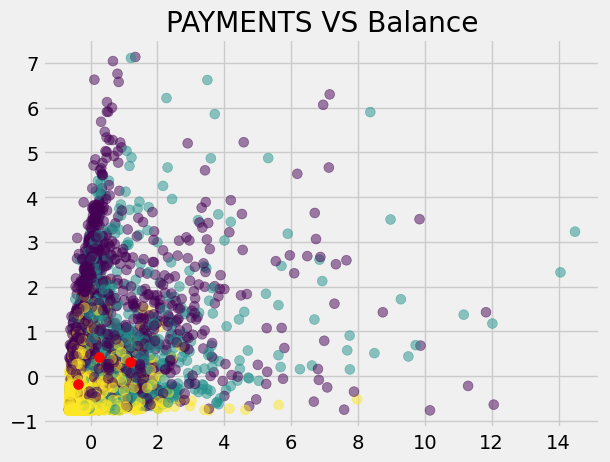

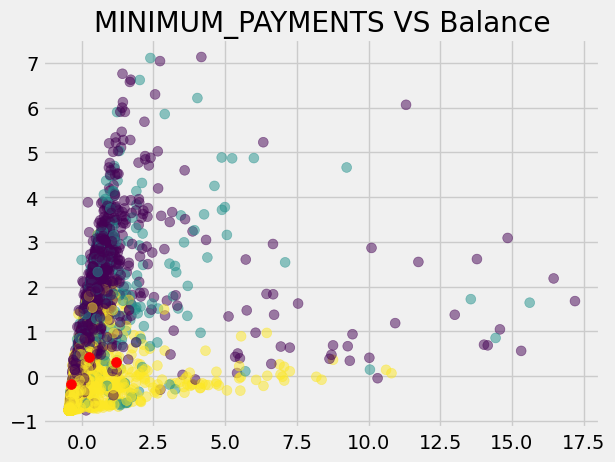

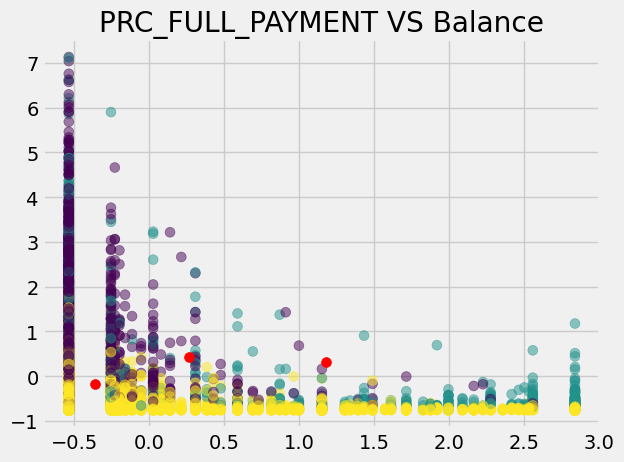

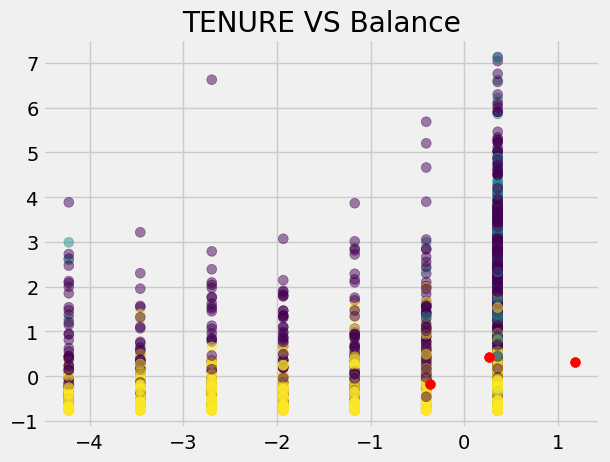

In [64]:
# finally n_cluster = 3 is the best

kmeans2 = KMeans(n_clusters=3)
kmeans2.fit(scaled_features2)
centroids2 = kmeans2.cluster_centers_
print(centroids2)

for column in scaled_dataframe2.columns : 
    plt.scatter(scaled_dataframe2[column], scaled_dataframe2["BALANCE"], c = kmeans2.labels_.astype(float), s=50, alpha=0.5)
    plt.scatter(centroids2[:,0], centroids2[:,1], c = 'red', s=50)   
    plt.title(column + ' VS Balance')
    plt.show()

In [66]:
# finaly I found that df without outliers have better score  (but there is no difference between the number of cluster)
# also by comparision between their scatters, we can see, the location of centroids in df_withou_outliers is more logical
# but generally there are not a huge difference between them
# maybe it can be useful for unseen data, especially when they are outliers